# Supermarket Customer Analysis

### Objectives:
### Contents:

## 1. Import libraries

In [109]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import RobustScaler, StandardScaler
from sklearn.decomposition import FactorAnalysis, PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from yellowbrick.cluster import KElbowVisualizer
from sklearn.metrics import davies_bouldin_score, silhouette_score, calinski_harabasz_score

## 2. Loading data
Import data into df_orig as original dataset. Create copies of it for different data preprocessing steps.

In [2]:
df_orig = pd.read_csv('../data/Supermarket_customers.csv', sep="\t")
df_orig.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


## 3 Descriptive Statistics
Start exploring the dataset.

In [3]:
# Check the shape of the dataset
print(df_orig.shape)

# Check the data types of each column
print(df_orig.dtypes)

(2240, 29)
ID                       int64
Year_Birth               int64
Education               object
Marital_Status          object
Income                 float64
Kidhome                  int64
Teenhome                 int64
Dt_Customer             object
Recency                  int64
MntWines                 int64
MntFruits                int64
MntMeatProducts          int64
MntFishProducts          int64
MntSweetProducts         int64
MntGoldProds             int64
NumDealsPurchases        int64
NumWebPurchases          int64
NumCatalogPurchases      int64
NumStorePurchases        int64
NumWebVisitsMonth        int64
AcceptedCmp3             int64
AcceptedCmp4             int64
AcceptedCmp5             int64
AcceptedCmp1             int64
AcceptedCmp2             int64
Complain                 int64
Z_CostContact            int64
Z_Revenue                int64
Response                 int64
dtype: object


### 3.1 Numeric Features

In [4]:
# Get a summary of the numerical features in the dataset
df_orig.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,...,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,...,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,...,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,...,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,...,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


### 3.2 Categorical Features

In [5]:
# Get a summary of the categorical features in the dataset
df_orig.describe(include='object')

,Education,Marital_Status,Dt_Customer
count,2240,2240,2240
unique,5,8,663
top,Graduation,Married,31-08-2012
freq,1127,864,12


## 4. Exploratory Data Analysis

- Uncover insights about customer behavior and campaign success.
In the data regarding customers we mainly have two types of features: 
    - Features that describe the demography of customers like: Birth_year, Marital_status, Education, Incom, Kidhome, Teenhome.
    - Features that describe the behaviour of customers like: Amount of products purchased, place of purchase, dealing with campaings, complaining...

### 4.1 Demographic Features

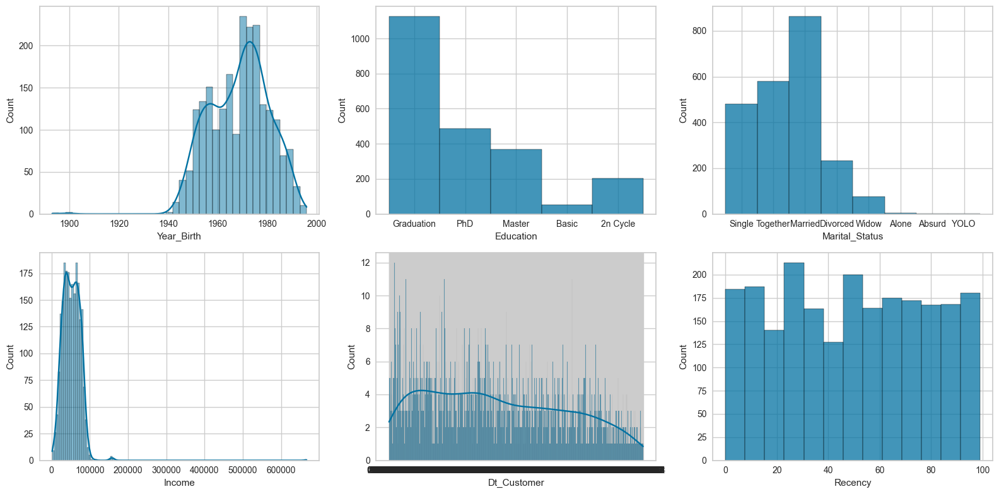

In [8]:
fig, axes = plt.subplots(2,3, figsize=(16, 8))

sns.histplot(df_orig['Year_Birth'], kde=True, ax=axes[0, 0])

sns.histplot(df_orig['Education'], ax=axes[0, 1])

sns.histplot(df_orig['Marital_Status'], ax=axes[0, 2])

sns.histplot(df_orig['Income'], kde=True, ax=axes[1, 0])

sns.histplot(df_orig['Dt_Customer'], kde=True, ax=axes[1, 1])

# No. of days since last purchase
sns.histplot(df_orig['Recency'], ax=axes[1, 2])

#sns.histplot(df['total_spending'], ax=axes[2, 1])

# no. of visits to the company's website in the last month
#sns.histplot(df['NumWebVisitsMonth'], ax=axes[2, 2])

plt.tight_layout()
plt.show()

** There exist outliers in Year_Birth and Income columns that need to be addressed. **

Text(0.5, 1.0, 'Number of Kids VS Number of Teens in Customer Household')

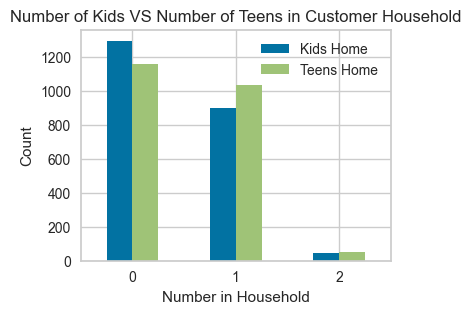

In [9]:
kid = df_orig.Kidhome.value_counts()
teen = df_orig.Teenhome.value_counts()

counts = pd.DataFrame({0:[kid[0], teen[0]], 1:[kid[1], teen[1]] ,2:[kid[2], teen[2]]},
                    index=['Kids Home', 'Teens Home']).T

counts.plot(kind="bar", rot=0, figsize=(4,3));
plt.xlabel("Number in Household")
plt.ylabel("Count")
plt.title("Number of Kids VS Number of Teens in Customer Household")

### 4.2 Features Showing Behaviour

#### Products

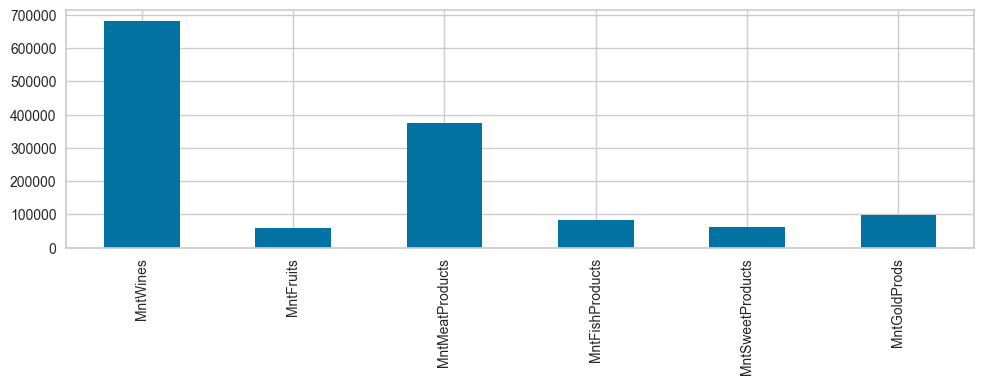

In [ ]:
# Products
df_orig[['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']].sum().plot(kind='bar', figsize=(10, 4))

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

** Spending on Products based on Education level**

Text(0.5, 1.0, 'Average Amount Spent On Products for Each Education Level')

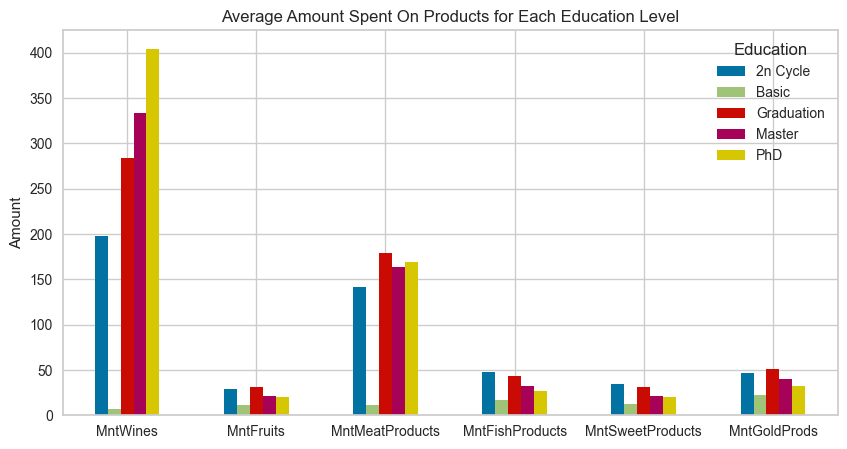

In [11]:
# Spending by Education level
cat = df_orig.groupby('Education')[['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts',
          'MntSweetProducts', 'MntGoldProds']].mean().T

cat.plot(kind='bar', rot=0, figsize=(10,5));
plt.ylabel("Amount")
plt.title("Average Amount Spent On Products for Each Education Level")

Text(0.5, 1.0, 'Ratio of Discounted Purchases to Normal Perchases Per Education Level')

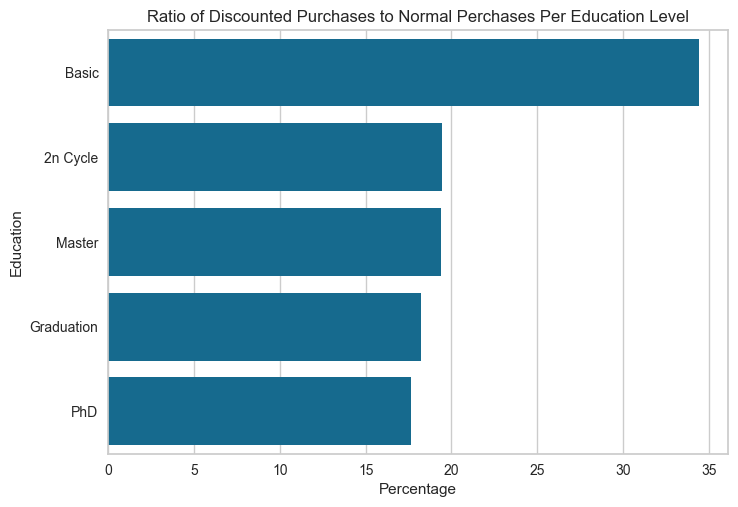

In [12]:
discounted_purchases = df_orig.groupby('Education').NumDealsPurchases.sum()
total_purchases = df_orig.groupby('Education')[['NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases']].sum().sum(axis=1)

percentage = round(discounted_purchases * 100 / total_purchases, 2).sort_values(ascending=False)
sns.barplot(y=percentage.index, x=percentage.values);
plt.xlabel("Percentage")
plt.ylabel("Education")
plt.title("Ratio of Discounted Purchases to Normal Perchases Per Education Level")

#### Acceptance of Campaigns

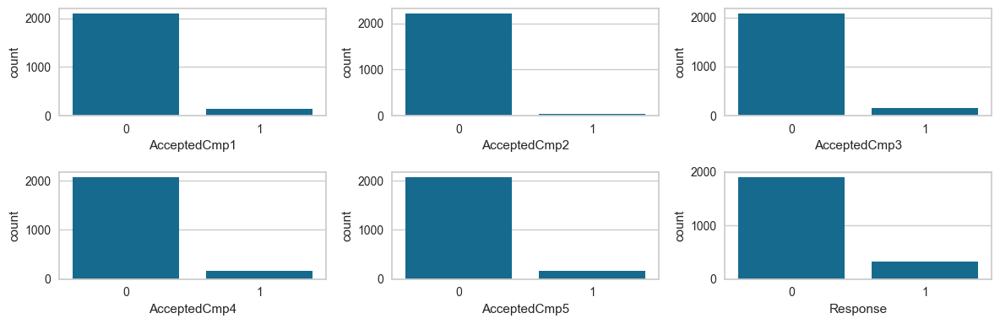

In [13]:
fig, axes = plt.subplots(2, 3, figsize=(12, 4))

sns.countplot(x=df_orig['AcceptedCmp1'], ax=axes[0,0])

sns.countplot(x=df_orig['AcceptedCmp2'], ax=axes[0,1])

sns.countplot(x=df_orig['AcceptedCmp3'], ax=axes[0, 2])

sns.countplot(x=df_orig['AcceptedCmp4'], ax=axes[1,0])

sns.countplot(x=df_orig['AcceptedCmp5'], ax=axes[1,1])

sns.countplot(x=df_orig['Response'], ax=axes[1,2])

plt.tight_layout()
plt.show()

#### Places of Purchase

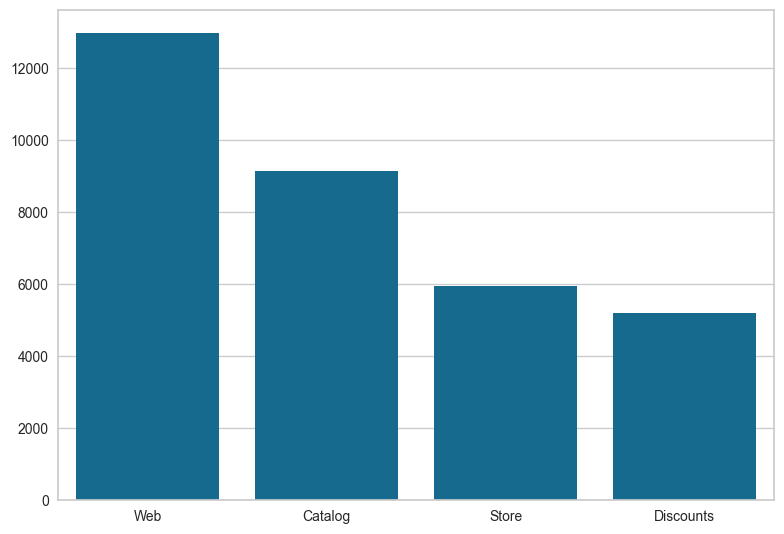

In [14]:
# Looking at the method of buying
buying_method = df_orig[['NumStorePurchases', 'NumWebPurchases', 'NumCatalogPurchases','NumDealsPurchases']].sum()
names = ['Web','Catalog','Store','Discounts']

sns.barplot(y= buying_method.values, x=names)

plt.tight_layout()
plt.show()

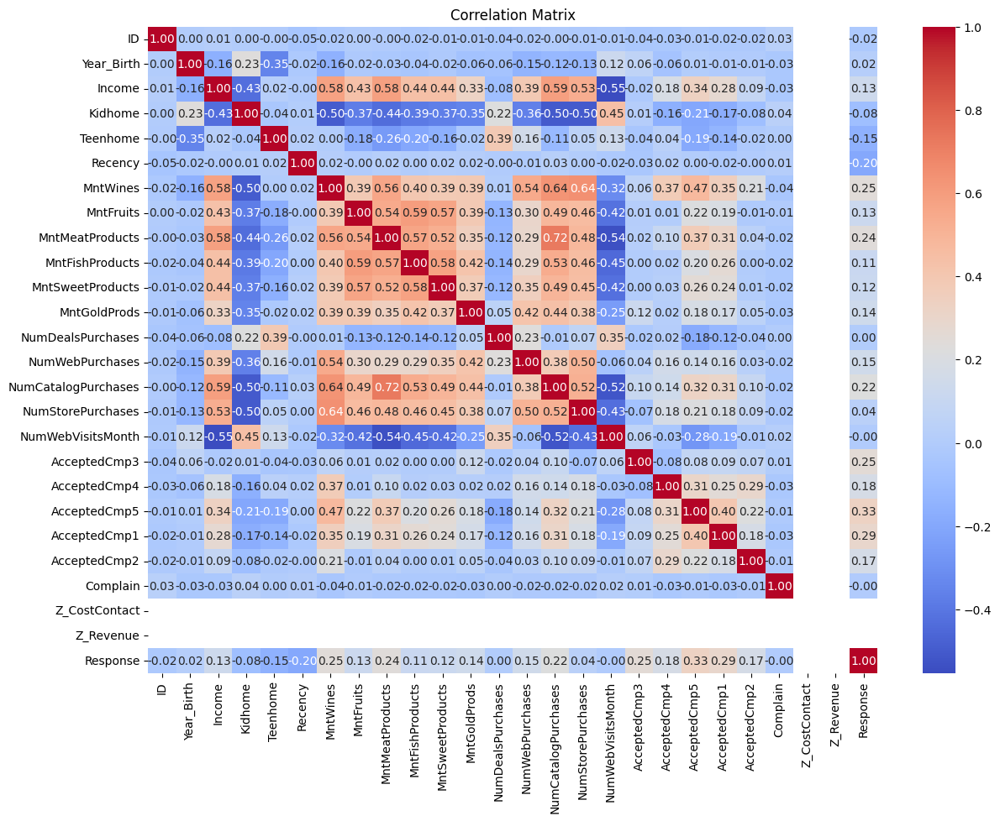

In [16]:
# Example heatmap for correlations of data before categorical encoding
plt.figure(figsize=(14, 10))
sns.heatmap(df_orig.corr(numeric_only=True), annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

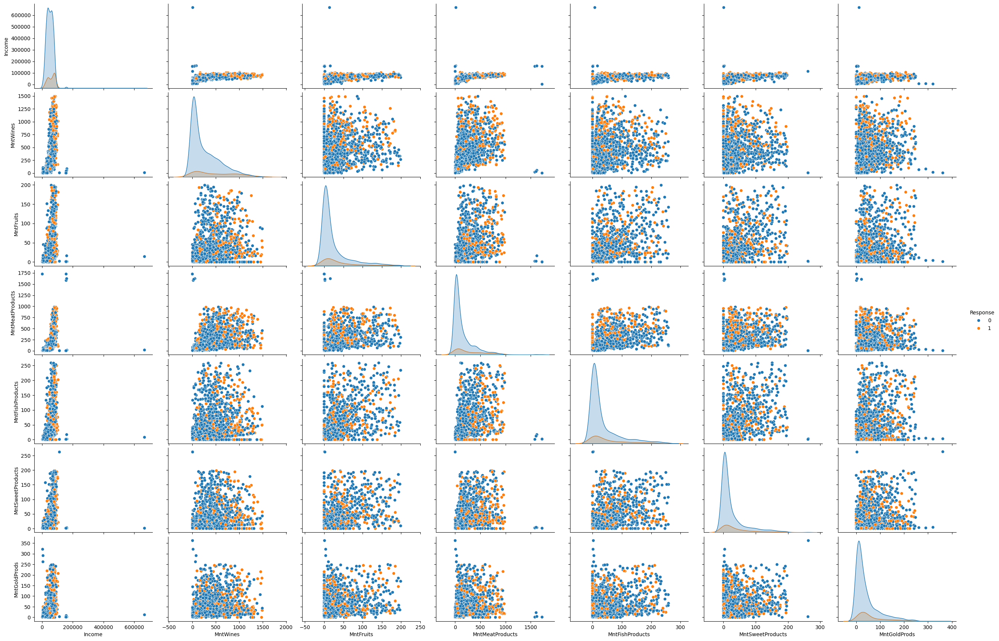

In [17]:
Mnt_features = ['Income', 'MntWines', 'MntFruits','MntMeatProducts', 'MntFishProducts','MntSweetProducts', 'MntGoldProds', 'Response']
sns.pairplot(df_orig[Mnt_features], hue='Response', height=2.5, aspect=1.5, diag_kind='kde')

### 4.2 Identifying Missing Values

In [15]:
# Check for missing values in the 'Income' column
print(df_orig['Income'].isnull().sum())

24


### 4.3 Identifying Outliers

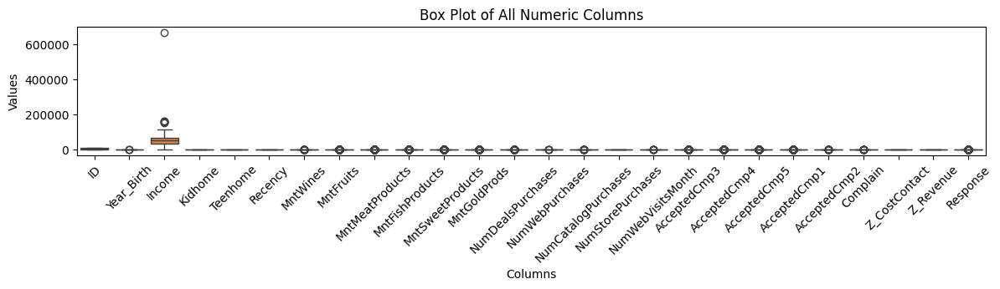

In [19]:
# Set the size of the plot
plt.figure(figsize=(14, 2))

# Create box plots for all numeric columns
sns.boxplot(data=df_orig.select_dtypes(include=[np.number]))

# Add title and labels
plt.title('Box Plot of All Numeric Columns')
plt.xlabel('Columns')
plt.ylabel('Values')

# Show the plot
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.show()

## 5. Data Cleaning

Create a copy of the df_orig into df.

In [4]:
df = df_orig.copy()

# Columns Z_CostContact and Z_Revenue have the same value for all entries and don't add anything to the data.
df.drop(columns=['Z_CostContact','Z_Revenue'], inplace=True, axis=1)

# Setting ID as index
df = df.set_index('ID')

df.shape

(2240, 26)

### 5.1 Handling Missing Values

We have 24 missing values in the Income column. There are many ways to handle it, one is to fill it using the mode of Income with the same Education and Marital_Status columns. We could also add Age later and compare it with the existing results.

In [5]:
# Function to impute missing values in 'Income' with the mode based on 'Education' and 'Marital_Status'
def impute_mode(row):
    if pd.isnull(row['Income']):
        return df[(df['Education'] == row['Education']) & 
                  #(df['Age'] == row['Age']) &
                  (df['Marital_Status'] == row['Marital_Status'])]['Income'].mode()[0]
    else:
        return row['Income']

# Apply the function to fill missing values
df['Income'] = df.apply(impute_mode, axis=1)

### 5.2 Handling Outliers

In [6]:
# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = df['Income'].quantile(0.25)
Q3 = df['Income'].quantile(0.75)
IQR = Q3 - Q1

# Define bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outlier = 200000

# Remove outliers
#df = df[(df['Income'] >= lower_bound) & (df['Income'] <= upper_bound)]
df = df[(df['Income'] >= lower_bound) & (df['Income'] < outlier)]
df.shape

(2239, 26)

If we proceed with predicting income values, we could also predict income for the outliers.

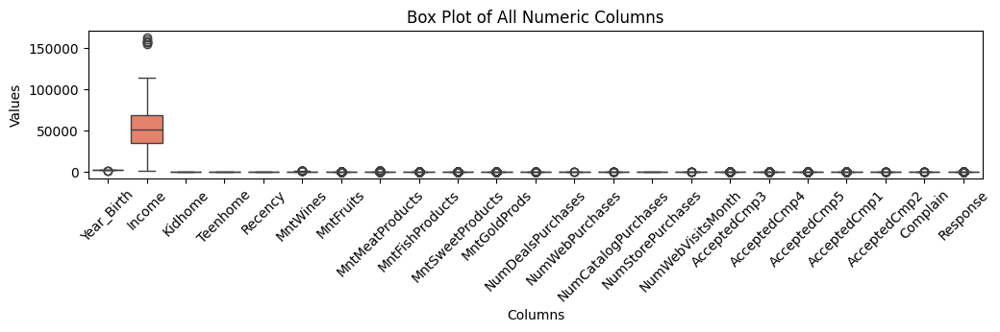

In [50]:
# Set the size of the plot
plt.figure(figsize=(12, 2))

# Create box plots for all numeric columns
sns.boxplot(data=df.select_dtypes(include=[np.number]))

# Add title and labels
plt.title('Box Plot of All Numeric Columns')
plt.xlabel('Columns')
plt.ylabel('Values')

# Show the plot
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.show()

### 3.3 Convert Data Types:

In [7]:
df['Age'] = 2024 - df['Year_Birth']
df.drop(['Year_Birth'], axis=1, inplace=True)

In [8]:
# Convert date strings to datetime
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'], format='mixed').dt.year.astype('int64')

In [9]:
df['Marital_Status'] = df['Marital_Status'].replace({'YOLO':'Single', 'Absurd':'Single', 'Alone':'Single', 'Married':'Together'})
df['Education'] = df['Education'].replace({'2n Cycle':'Master'})

In [10]:
# total_children
df['total_children'] = df['Kidhome'] + df['Teenhome']

# total_spendings
df["total_spending"] = df["MntWines"]+ df["MntFruits"]+ df["MntMeatProducts"]+ df["MntFishProducts"]+ df["MntSweetProducts"]+ df["MntGoldProds"]

# total_num_of_purchases
df['num_purchase'] = df['NumDealsPurchases'] + df['NumWebPurchases'] + df['NumCatalogPurchases'] + df['NumStorePurchases']

In [23]:
df.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,...,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,total_children,total_spending,num_purchase
ID,,,,,,,,,,,,,,,,,,,,,
5524,Graduation,Single,58138.0,0,0,2012,58,635,88,546,...,0,0,0,0,0,1,67,0,1617,25
2174,Graduation,Single,46344.0,1,1,2014,38,11,1,6,...,0,0,0,0,0,0,70,2,27,6
4141,Graduation,Together,71613.0,0,0,2013,26,426,49,127,...,0,0,0,0,0,0,59,0,776,21
6182,Graduation,Together,26646.0,1,0,2014,26,11,4,20,...,0,0,0,0,0,0,40,1,53,8
5324,PhD,Together,58293.0,1,0,2014,94,173,43,118,...,0,0,0,0,0,0,43,1,422,19


Now create a copy of **df** into **df_encoded** so that we could later use df.

In [11]:
# Create a new copy of dataset that has categorical features encoded
df_encoded = df.copy()

# One-hot encoding
df_encoded = pd.get_dummies(df, columns=['Marital_Status'])

In [12]:
le = LabelEncoder()
df_encoded['Education'] = le.fit_transform(df['Education'])

In [13]:
df_encoded #.drop(columns= ['Kidhome','Teenhome'])

,Education,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,Complain,Response,Age,total_children,total_spending,num_purchase,Marital_Status_Divorced,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow
ID,,,,,,,,,,,,,,,,,,,,,
5524,1,58138.0,0,0,2012,58,635,88,546,172,...,0,1,67,0,1617,25,False,True,False,False
2174,1,46344.0,1,1,2014,38,11,1,6,2,...,0,0,70,2,27,6,False,True,False,False
4141,1,71613.0,0,0,2013,26,426,49,127,111,...,0,0,59,0,776,21,False,False,True,False
6182,1,26646.0,1,0,2014,26,11,4,20,10,...,0,0,40,1,53,8,False,False,True,False
5324,3,58293.0,1,0,2014,94,173,43,118,46,...,0,0,43,1,422,19,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10870,1,61223.0,0,1,2013,46,709,43,182,42,...,0,0,57,1,1341,18,False,False,True,False
4001,3,64014.0,2,1,2014,56,406,0,30,0,...,0,0,78,3,444,22,False,False,True,False
7270,1,56981.0,0,0,2014,91,908,48,217,32,...,0,0,43,0,1241,19,True,False,False,False


### Correlation between features

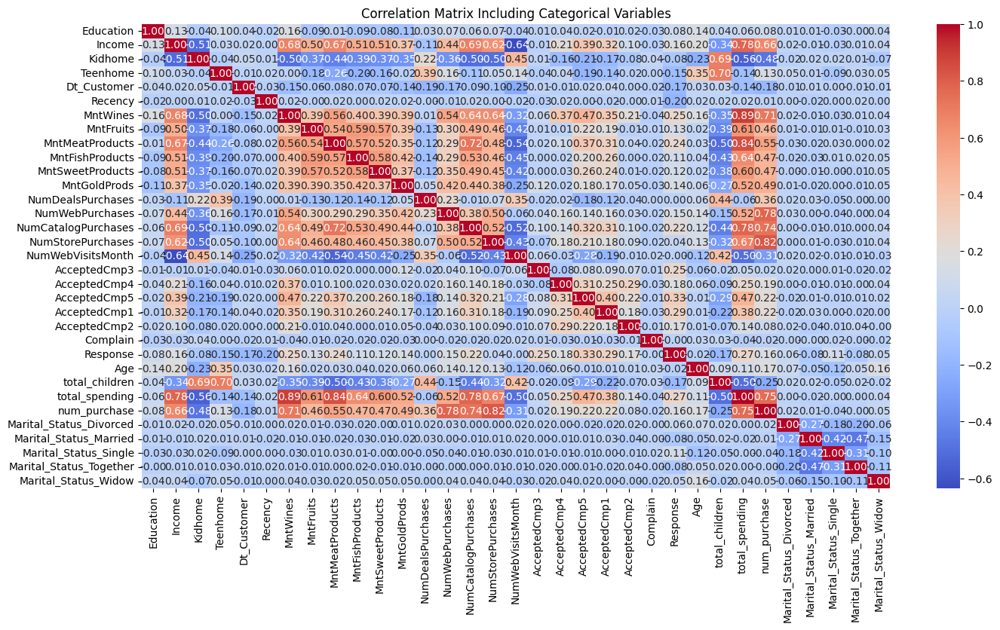

In [59]:
# Heatmap after categorical encoding
plt.figure(figsize=(16, 8))
sns.heatmap(df_encoded.corr(),annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix Including Categorical Variables')
plt.show()

More detailed view of feature correlation with each other in a segmented view.

** Relation of Income with different products distinguished by resoponse **

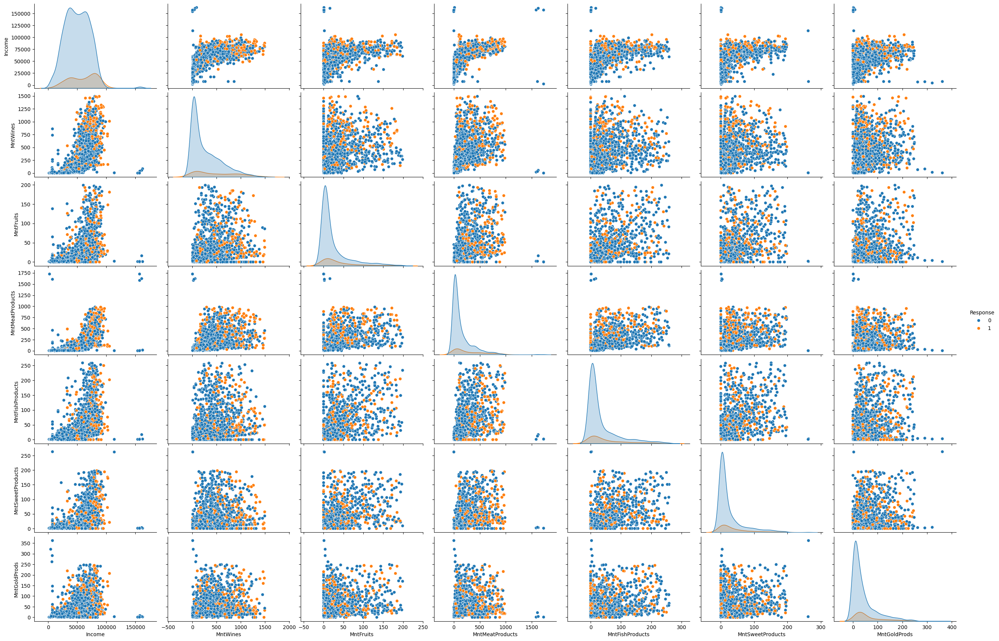

In [60]:
Mnt_features = ['Income', 'MntWines', 'MntFruits','MntMeatProducts', 'MntFishProducts','MntSweetProducts', 'MntGoldProds', 'Response']
sns.pairplot(df[Mnt_features], hue='Response', height=2.5, aspect=1.5, diag_kind='kde')

## 5. Scaling Data
Here we use two scaling methods since our data has some outliers, to see which one gives better results.

In [14]:
X = df_encoded

In [15]:
# Scale the data
rb_scaler = RobustScaler()
X_rb_scaled = rb_scaler.fit_transform(X)

In [16]:
st_scaler = StandardScaler()
X_st_scaled = st_scaler.fit_transform(X)

## 6. Clustering
Here we use multiple clustering methods to compare the results and findout the best one for this data.

### 6.1 Number of Clusters with Elbow Method

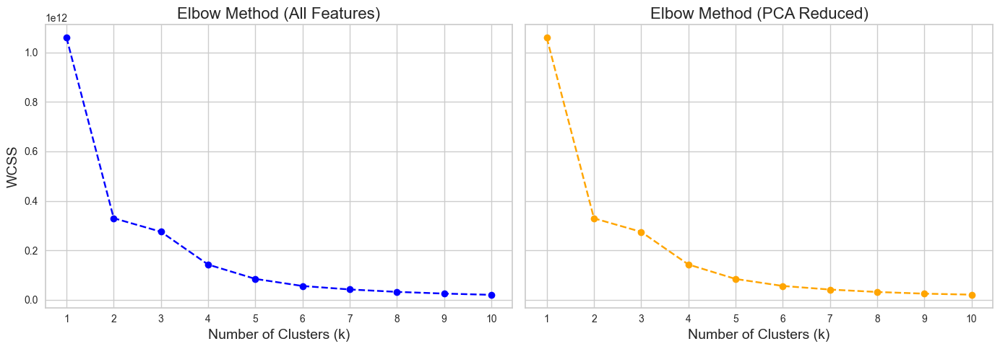

In [17]:
# Using elbow method
wcss = []
for k in range(1, 11):  # Test 1 to 10 clusters
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    kmeans.fit(df_encoded)
    wcss.append(kmeans.inertia_)  # Inertia is the WCSS value

# Apply PCA to reduce dimensions while keeping 95% variance
pca = PCA(n_components=0.95)  # Retain 95% of variance
data_pca = pca.fit_transform(df_encoded)

# Run k-Means on reduced data
wcss_pca = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    kmeans.fit(data_pca)
    wcss_pca.append(kmeans.inertia_)

# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

# Subplot 1: WCSS for all features
axes[0].plot(range(1, 11), wcss, marker='o', linestyle='--', color='blue')
axes[0].set_title('Elbow Method (All Features)', fontsize=16)
axes[0].set_xlabel('Number of Clusters (k)', fontsize=14)
axes[0].set_ylabel('WCSS', fontsize=14)
axes[0].set_xticks(range(1, 11))
axes[0].grid(True)

# Subplot 2: WCSS for PCA-reduced data
axes[1].plot(range(1, 11), wcss_pca, marker='o', linestyle='--', color='orange')
axes[1].set_title('Elbow Method (PCA Reduced)', fontsize=16)
axes[1].set_xlabel('Number of Clusters (k)', fontsize=14)
axes[1].set_xticks(range(1, 11))
axes[1].grid(True)

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()

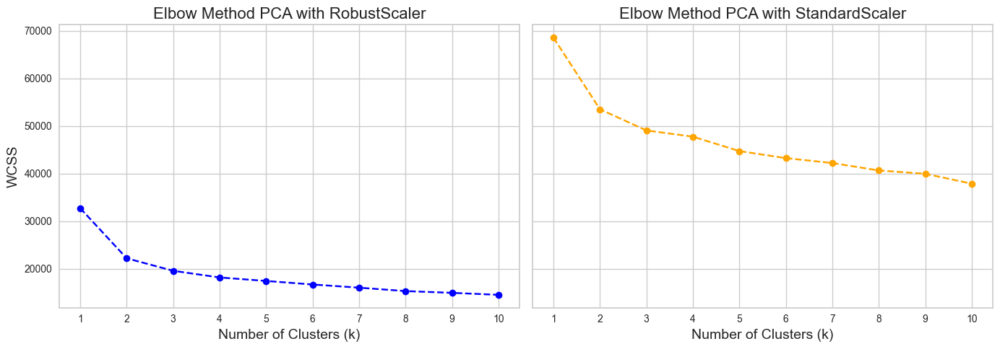

In [18]:
# Apply PCA to reduce dimensions while keeping 95% variance
pca = PCA(n_components=0.95)  # Retain 95% of variance
data_pca_rb = pca.fit_transform(X_rb_scaled)

# Run k-Means on reduced data
wcss_pca_rb = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    kmeans.fit(data_pca_rb)
    wcss_pca_rb.append(kmeans.inertia_)


# Apply PCA to reduce dimensions while keeping 95% variance
pca = PCA(n_components=0.95)  # Retain 95% of variance
data_pca_st = pca.fit_transform(X_st_scaled)

# Run k-Means on reduced data
wcss_pca_st = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    kmeans.fit(data_pca_st)
    wcss_pca_st.append(kmeans.inertia_)

# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

# Subplot 1: WCSS for all features
axes[0].plot(range(1, 11), wcss_pca_rb, marker='o', linestyle='--', color='blue')
axes[0].set_title('Elbow Method PCA with RobustScaler', fontsize=16)
axes[0].set_xlabel('Number of Clusters (k)', fontsize=14)
axes[0].set_ylabel('WCSS', fontsize=14)
axes[0].set_xticks(range(1, 11))
axes[0].grid(True)

# Subplot 2: WCSS for PCA-reduced data
axes[1].plot(range(1, 11), wcss_pca_st, marker='o', linestyle='--', color='orange')
axes[1].set_title('Elbow Method PCA with StandardScaler', fontsize=16)
axes[1].set_xlabel('Number of Clusters (k)', fontsize=14)
axes[1].set_xticks(range(1, 11))
axes[1].grid(True)

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()

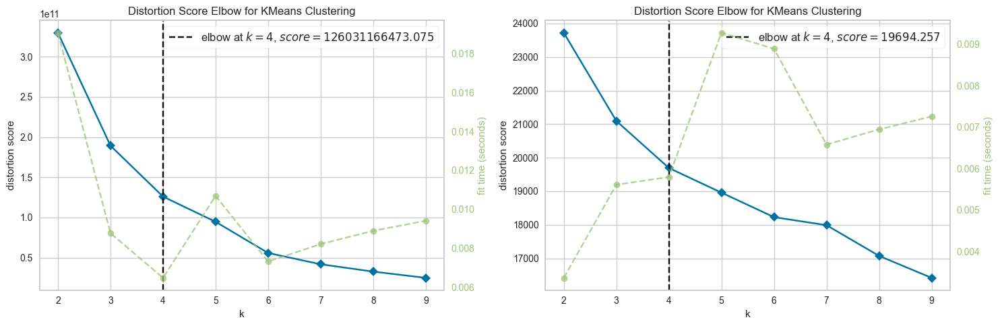

In [19]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))  # 1 row, 2 columns

# Elbow visualizer for the first dataset
ax1 = axes[0]
model1 = KMeans()
visualizer1 = KElbowVisualizer(model1, k=(2, 10), ax=ax1)
visualizer1.fit(df_encoded)
visualizer1.finalize()  # Finalize ensures the plot works within a subplot

# Elbow visualizer for the second dataset
ax2 = axes[1]
model2 = KMeans()
visualizer2 = KElbowVisualizer(model2, k=(2, 10), ax=ax2)
visualizer2.fit(X_rb_scaled)
visualizer2.finalize()  # Finalize ensures the plot works within a subplot

# Adjust layout and show the plots
plt.tight_layout()
plt.show()

/Users/mariam/Documents/Projects for Github/Customer Personality Analysis/.venv/lib/python3.11/site-packages/yellowbrick/utils/kneed.py:156: YellowbrickWarning: No 'knee' or 'elbow point' detected This could be due to bad clustering, no actual clusters being formed etc.
  warnings.warn(warning_message, YellowbrickWarning)
/Users/mariam/Documents/Projects for Github/Customer Personality Analysis/.venv/lib/python3.11/site-packages/yellowbrick/cluster/elbow.py:374: YellowbrickWarning: No 'knee' or 'elbow' point detected, pass `locate_elbow=False` to remove the warning
  warnings.warn(warning_message, YellowbrickWarning)


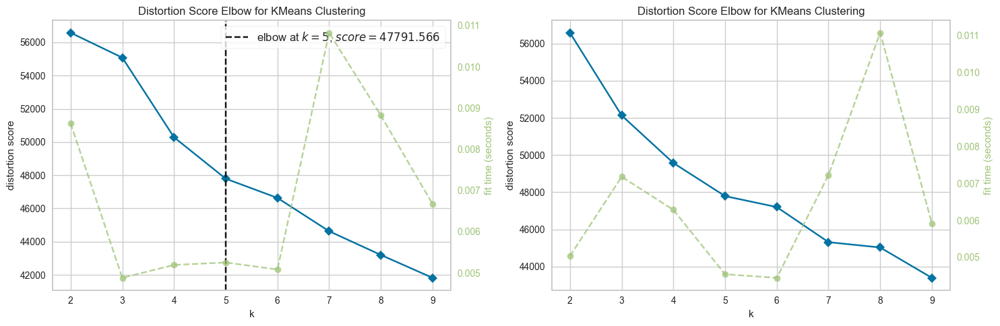

In [20]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))  # 1 row, 2 columns

# Elbow visualizer for the first dataset
ax1 = axes[0]
model1 = KMeans()
visualizer1 = KElbowVisualizer(model1, k=(2, 10), ax=ax1)
visualizer1.fit(X_st_scaled)
visualizer1.finalize()  # Finalize ensures the plot works within a subplot

# Elbow visualizer for the second dataset
ax2 = axes[1]
model2 = KMeans()
visualizer2 = KElbowVisualizer(model2, k=(2, 10), ax=ax2)
visualizer2.fit(X_st_scaled)
visualizer2.finalize()  # Finalize ensures the plot works within a subplot

# Adjust layout and show the plots
plt.tight_layout()
plt.show()

According to the elbow method the cluster size is 4.

### 6.2 Heirarchical/ Agglomerative Clustering

In [121]:
n_clusters = 4  # Example
agglomerative = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
labels = agglomerative.fit_predict(df_encoded)

# RB
agglomerative_rb = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
labels_rb = agglomerative.fit_predict(X_rb_scaled)

# ST
agglomerative_st = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
labels_st = agglomerative.fit_predict(X_st_scaled)

In [ ]:
from sklearn.metrics import silhouette_score

silhouette_agg = silhouette_score(X_rb_scaled, labels)
print(f"Silhouette Score: {silhouette_agg}")

Silhouette Score: 0.07554177059832207


4 Clusters Original data Silhouette Score:  0.4908276975917701, 2 Clusters: 0.5818783309389715, 3 clusters: 0.5333544561282128, 5 CL: 0.5061310872365289, [0.18625955379505305]
4 Clusters StandardScaler Silhouette Score:  0.14076607472224228,  2CL: 0.1607566280788978, 3CL: 0.13256694740634958, 5CL: 0.14342889554182045, 6CL: 0.15220606555003713, 7CL: 0.15740794913809267 , 8CL: 0.15871479562991328   [0.19830528640843056]
4 Clusters  RobustScaling Silhouette Score:  0.15420521847547913, 2CL: 0.32853856894613587, 3CL:  0.1688449824413714, 5CL: 0.13018888919068447, 6CL: 0.1331699037670009 , 9cl: 0.07875958810924102  [0.2638015062643321]

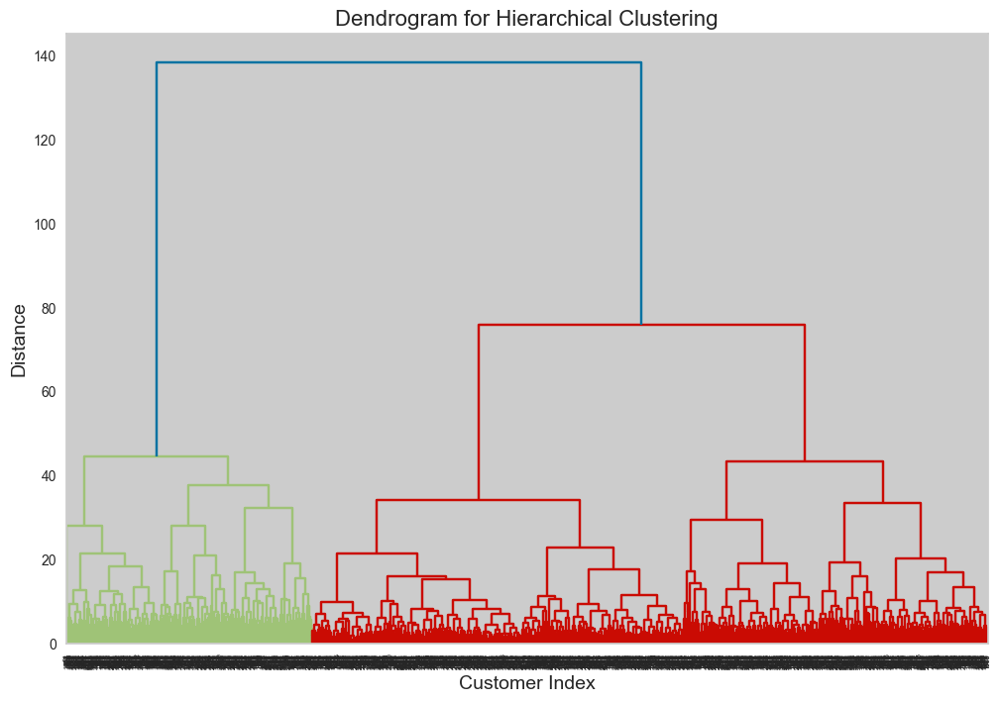

In [26]:
from scipy.cluster.hierarchy import dendrogram, linkage

# Compute linkage matrix
linkage_matrix = linkage(X_rb_scaled, method='ward')

# Plot the dendrogram
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 8))
dendrogram(linkage_matrix)
plt.title("Dendrogram for Hierarchical Clustering", fontsize=16)
plt.xlabel("Customer Index", fontsize=14)
plt.ylabel("Distance", fontsize=14)
plt.show()

In [58]:
df_encoded['Cluster_Agg'] = labels

### 6.3 DBSCAN Clustering

In [120]:
# DBSCAN Clustering
dbscan = DBSCAN(eps=0.7, min_samples=5).fit(df_encoded)
cluster_dbscan = dbscan.labels_
#dbscan = DBSCAN(eps=0.5, min_samples=5)
#clusters = dbscan.fit_predict(X_rb_scaled)

# Add cluster labels to your original dataframe
df_encoded['Cluster_dbscan'] = cluster_dbscan

# Count the number of points in each cluster
#cluster_counts = df_encoded['Cluster_dbscan'].value_counts().sort_index()

# RB
dbscan_rb = DBSCAN(eps=0.7, min_samples=5).fit(X_rb_scaled)
cluster_dbscan_rb = dbscan_rb.labels_
#df_encoded['Cluster_dbscan'] = cluster_dbscan


#ST
dbscan_st = DBSCAN(eps=0.7, min_samples=5).fit(X_rb_scaled)
cluster_dbscan_st = dbscan_st.labels_
#df_encoded['Cluster_dbscan'] = cluster_dbscan



### 6.4 K-Means Clustering

In [119]:
clusterNum = 4

k_means = KMeans(init = "k-means++", n_clusters = clusterNum, n_init = 12)
k_means.fit(df_encoded)
labels_kmeans = k_means.labels_
df_encoded["Clus_km"] = labels_kmeans
km_mean = df_encoded.groupby('Clus_km').mean()

k_means_st = KMeans(init = "k-means++", n_clusters = clusterNum, n_init = 12)
k_means_st.fit(X_st_scaled)
labels_kmeans_st = k_means_st.labels_
df_encoded["Clus_km_st"] = labels_kmeans_st
st_X_mean = df_encoded.groupby('Clus_km_st').mean()

k_means_rb = KMeans(init = "k-means++", n_clusters = clusterNum, n_init = 12)
k_means_rb.fit(X_rb_scaled)
labels_kmeans_rb = k_means_rb.labels_
df_encoded["Clus_km_rb"] = labels_kmeans_rb
rb_X_mean = df_encoded.groupby('Clus_km_rb').mean()



In [124]:
# Calculate metrics
silhouette_kmeans = silhouette_score(df_encoded, labels_kmeans)
calinski_harabasz_kmeans = calinski_harabasz_score(df_encoded, labels_kmeans)
davies_bouldin_kmeans = davies_bouldin_score(df_encoded, labels_kmeans)

#silhouette_dbscan = silhouette_score(df_encoded, cluster_dbscan)
#calinski_harabasz_dbscan = calinski_harabasz_score(df_encoded, cluster_dbscan)
#davies_bouldin_dbscan = davies_bouldin_score(df_encoded, cluster_dbscan)

silhouette_agg = silhouette_score(df_encoded, labels)
calinski_harabasz_dbscan = calinski_harabasz_score(df_encoded, labels)
davies_bouldin_dbscan = davies_bouldin_score(df_encoded, labels)

# RB Calculate metrics
silhouette_kmeans_rb = silhouette_score(X_rb_scaled, labels_kmeans_rb)
calinski_harabasz_kmeans_rb = calinski_harabasz_score(X_rb_scaled, labels_kmeans_rb)
davies_bouldin_kmeans_rb = davies_bouldin_score(X_rb_scaled, labels_kmeans_rb)

#silhouette_dbscan_rb = silhouette_score(X_rb_scaled, cluster_dbscan)
#calinski_harabasz_dbscan_rb = calinski_harabasz_score(X_rb_scaled, cluster_dbscan)
#davies_bouldin_dbscan_rb = davies_bouldin_score(X_rb_scaled, cluster_dbscan)

silhouette_agg_rb = silhouette_score(X_rb_scaled, labels_rb)
calinski_harabasz_dbscan_rb = calinski_harabasz_score(X_rb_scaled, labels_rb)
davies_bouldin_dbscan_rb = davies_bouldin_score(X_rb_scaled, labels_rb)

# ST Calculate metrics
silhouette_kmeans_st = silhouette_score(X_rb_scaled, labels_kmeans_st)
calinski_harabasz_kmeans_st = calinski_harabasz_score(X_rb_scaled, labels_kmeans_st)
davies_bouldin_kmeans_st = davies_bouldin_score(X_rb_scaled, labels_kmeans_st)

#silhouette_dbscan_st = silhouette_score(X_rb_scaled, cluster_dbscan)
#calinski_harabasz_dbscan_st = calinski_harabasz_score(X_rb_scaled, cluster_dbscan)
#davies_bouldin_dbscan_st = davies_bouldin_score(X_rb_scaled, cluster_dbscan)

silhouette_agg_st = silhouette_score(X_st_scaled, labels_st)
calinski_harabasz_dbscan_st = calinski_harabasz_score(X_st_scaled, labels_st)
davies_bouldin_dbscan_st = davies_bouldin_score(X_st_scaled, labels_st)

In [127]:
print('Metrics for scaled data with RobustScaler:')
print("Aggl Metrics:")
print("Silhouette Score:", silhouette_agg_rb)
print("Calinski-Harabasz Index:", calinski_harabasz_kmeans_rb)
print("Davies-Bouldin Index:", davies_bouldin_kmeans_rb)

print("\nK-Means Metrics:")
print("Silhouette Score:", silhouette_kmeans_rb)
print("Calinski-Harabasz Index:", calinski_harabasz_kmeans_rb)
print("Davies-Bouldin Index:", davies_bouldin_kmeans_rb)

#print("\nDBSCAN Metrics:")
#print("Silhouette Score:", silhouette_dbscan)
#print("Calinski-Harabasz Index:", calinski_harabasz_dbscan)
#print("Davies-Bouldin Index:", davies_bouldin_dbscan)

Metrics for scaled data with RobustScaler:
Aggl Metrics:
Silhouette Score: 0.15420521847547913
Calinski-Harabasz Index: 551.2302203532877
Davies-Bouldin Index: 2.115659514119489

K-Means Metrics:
Silhouette Score: 0.19075644335591468
Calinski-Harabasz Index: 551.2302203532877
Davies-Bouldin Index: 2.115659514119489


In [128]:
print('Metrics for scaled data with StandartScaler:')
print("Aggl Metrics:")
print("Silhouette Score:", silhouette_agg_st)
print("Calinski-Harabasz Index:", calinski_harabasz_kmeans_st)
print("Davies-Bouldin Index:", davies_bouldin_kmeans_st)

print("\nK-Means Metrics:")
print("Silhouette Score:", silhouette_kmeans_st)
print("Calinski-Harabasz Index:", calinski_harabasz_kmeans_st)
print("Davies-Bouldin Index:", davies_bouldin_kmeans_st)

#print("\nDBSCAN Metrics:")
#print("Silhouette Score:", silhouette_dbscan)
#print("Calinski-Harabasz Index:", calinski_harabasz_dbscan)
#print("Davies-Bouldin Index:", davies_bouldin_dbscan)

Metrics for scaled data with StandartScaler:
Aggl Metrics:
Silhouette Score: 0.14076607472224228
Calinski-Harabasz Index: 463.66169885419583
Davies-Bouldin Index: 3.1815894539744125

K-Means Metrics:
Silhouette Score: 0.17866804079969661
Calinski-Harabasz Index: 463.66169885419583
Davies-Bouldin Index: 3.1815894539744125


In [129]:
print('Metrics for scaled data with data without scaling:')
print("Aggl Metrics:")
print("Silhouette Score:", silhouette_agg)
print("Calinski-Harabasz Index:", calinski_harabasz_kmeans)
print("Davies-Bouldin Index:", davies_bouldin_kmeans)

print("\nK-Means Metrics:")
print("Silhouette Score:", silhouette_kmeans)
print("Calinski-Harabasz Index:", calinski_harabasz_kmeans)
print("Davies-Bouldin Index:", davies_bouldin_kmeans)

#print("\nDBSCAN Metrics:")
#print("Silhouette Score:", silhouette_dbscan)
#print("Calinski-Harabasz Index:", calinski_harabasz_dbscan)
#print("Davies-Bouldin Index:", davies_bouldin_dbscan)

Metrics for scaled data with data without scaling:
Aggl Metrics:
Silhouette Score: 0.4908276698443213
Calinski-Harabasz Index: 5517.078688547761
Davies-Bouldin Index: 0.5675469430962835

K-Means Metrics:
Silhouette Score: 0.5282768744008015
Calinski-Harabasz Index: 5517.078688547761
Davies-Bouldin Index: 0.5675469430962835


## 7. Visualizing Clusters

### 2D Clusters

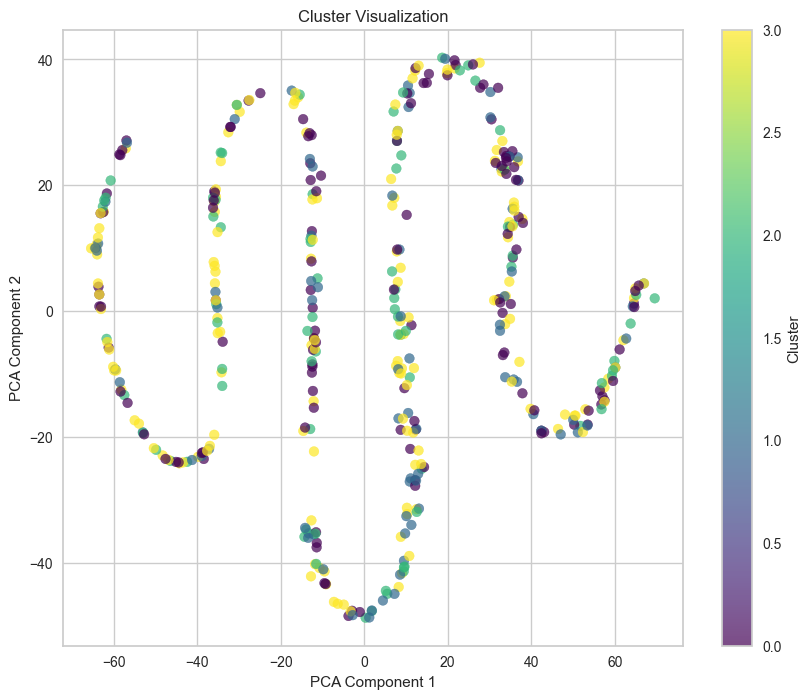

In [130]:
# Visualize the clusters
clusters = df_encoded['Clus_km']

# Use the same scaled data used for clustering
# Reduce the data to 2D for visualization using t-SNE
tsne_rb = TSNE(n_components=2).fit_transform(df_encoded)

# Convert to a DataFrame for easier plotting
tsne_df_rb = pd.DataFrame(tsne_rb, columns=['T1','T2'])
tsne_df_rb['Cluster'] = clusters

# Plot the clusters
plt.figure(figsize=(10, 8))
scatter = plt.scatter(tsne_df_rb['T1'], tsne_df_rb['T2'], c=tsne_df_rb['Cluster'], cmap='viridis', alpha=0.7)
plt.colorbar(scatter, label='Cluster')
plt.title('Cluster Visualization')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.grid(True)
plt.show()

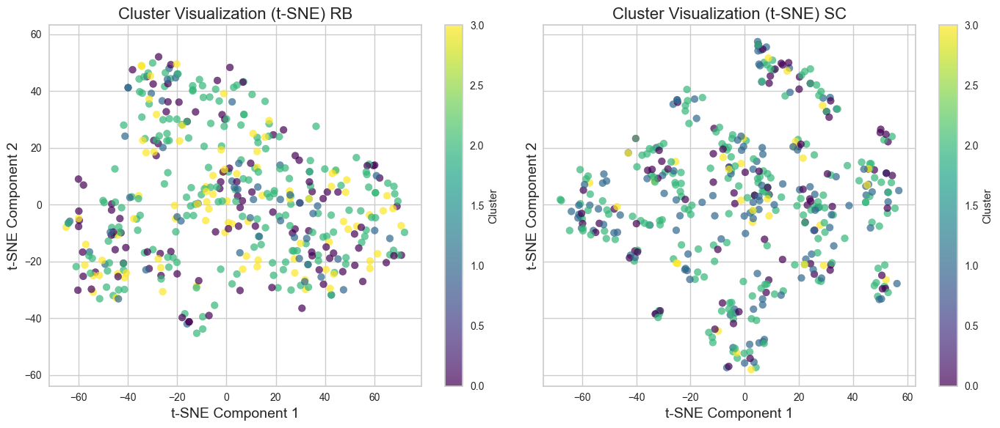

In [131]:
# t-SNE Visualization
tsne_rb = TSNE(n_components=2, random_state=42).fit_transform(X_rb_scaled)  # Reduce to 2D using t-SNE
tsne_df_rb = pd.DataFrame(tsne_rb, columns=['T1', 'T2'])
tsne_df_rb['Cluster'] = df_encoded['Clus_km_rb']

# t-SNE Visualization
tsne_st = TSNE(n_components=2, random_state=42).fit_transform(X_st_scaled)  # Reduce to 2D using t-SNE
tsne_df_st = pd.DataFrame(tsne_st, columns=['T1', 'T2'])
tsne_df_st['Cluster'] = df_encoded['Clus_km_st']

# Create Subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# t-SNE Plot
scatter1 = axes[0].scatter(tsne_df_rb['T1'], tsne_df_rb['T2'], c=tsne_df_rb['Cluster'], cmap='viridis', alpha=0.7)
axes[0].set_title('Cluster Visualization (t-SNE) RB', fontsize=16)
axes[0].set_xlabel('t-SNE Component 1', fontsize=14)
axes[0].set_ylabel('t-SNE Component 2', fontsize=14)
axes[0].grid(True)
cbar2 = fig.colorbar(scatter1, ax=axes[0], label='Cluster')

# t-SNE Plot
scatter2 = axes[1].scatter(tsne_df_st['T1'], tsne_df_st['T2'], c=tsne_df_st['Cluster'], cmap='viridis', alpha=0.7)
axes[1].set_title('Cluster Visualization (t-SNE) SC', fontsize=16)
axes[1].set_xlabel('t-SNE Component 1', fontsize=14)
axes[1].set_ylabel('t-SNE Component 2', fontsize=14)
axes[1].grid(True)
cbar2 = fig.colorbar(scatter2, ax=axes[1], label='Cluster')


# Adjust layout
plt.tight_layout()
plt.show()

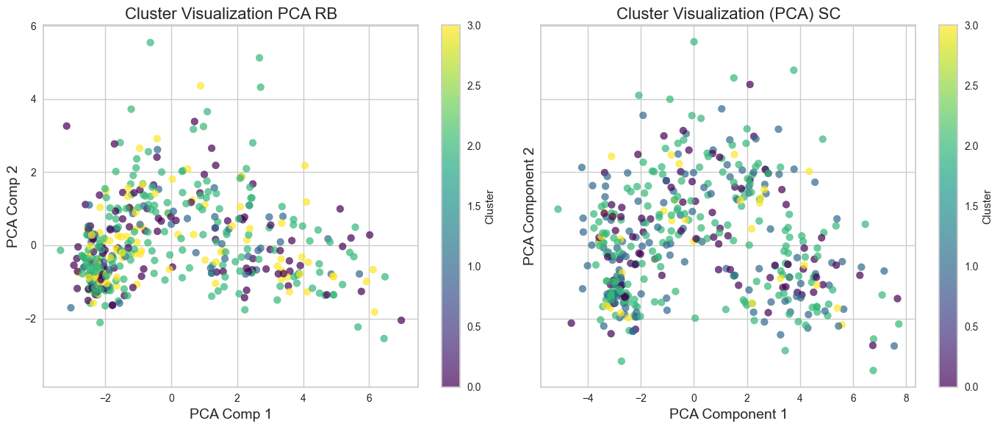

In [132]:
# PCA Visualization
pca1 = PCA(n_components=2)
X_pca_rb = pca1.fit_transform(X_rb_scaled)  # Reduce to 2D using PCA
pca_df_rb = pd.DataFrame(X_pca_rb, columns=['PCA1', 'PCA2'])
pca_df_rb['Cluster'] = df_encoded['Clus_km_rb']

pca2 = PCA(n_components=2)
X_pca_st= pca2.fit_transform(X_st_scaled)  # Reduce to 2D using PCA
pca_df_st = pd.DataFrame(X_pca_st, columns=['PCA1', 'PCA2'])
pca_df_st['Cluster'] = df_encoded['Clus_km_st']

# Create Subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# PCA Plot
scatter1 = axes[0].scatter(pca_df_rb['PCA1'], pca_df_rb['PCA2'], c=pca_df_rb['Cluster'], cmap='viridis', alpha=0.7)
axes[0].set_title('Cluster Visualization PCA RB', fontsize=16)
axes[0].set_xlabel('PCA Comp 1', fontsize=14)
axes[0].set_ylabel('PCA Comp 2', fontsize=14)
axes[0].grid(True)
cbar1 = fig.colorbar(scatter1, ax=axes[0], label='Cluster')

scatter2 = axes[1].scatter(pca_df_st['PCA1'], pca_df_st['PCA2'], c=pca_df_st['Cluster'], cmap='viridis', alpha=0.7)
axes[1].set_title('Cluster Visualization (PCA) SC', fontsize=16)
axes[1].set_xlabel('PCA Component 1', fontsize=14)
axes[1].set_ylabel('PCA Component 2', fontsize=14)
axes[1].grid(True)
cbar1 = fig.colorbar(scatter1, ax=axes[1], label='Cluster')


# Adjust layout
plt.tight_layout()
plt.show()

### 3D Clusers

In [166]:
pca_rb = PCA(n_components=3)
pca_comps_rb = pca_rb.fit_transform(X_rb_scaled)
pca_df_rb = pd.DataFrame(pca_comps_rb, columns=['P1','P2', 'P3'])
pca_df_rb

,P1,P2,P3
0,4.751946,0.177069,-0.937337
1,-2.419504,-0.470798,-0.208920
2,1.589408,-0.549209,-0.024344
3,-2.171462,-1.078332,-0.486206
4,-0.104405,0.534005,0.240326
...,...,...,...
2234,3.209229,1.343232,-2.172882
2235,-1.917701,3.034526,0.703905
2236,0.909613,-0.799342,0.866137
2237,1.357161,0.482885,0.768652


In [167]:
import plotly.express as px
import nbformat

def visualize_clustering(data, predictions=None, marker_size=3, title="Principal Components in 3-Dimensions"):
  if predictions is not None:
    data['preds'] = predictions
    fig = px.scatter_3d(data, x='P1', y='P2', z='P3', color='preds',
                      color_discrete_sequence=px.colors.qualitative.Pastel, opacity=0.5)
  else:
    fig = px.scatter_3d(data, x='P1', y='P2', z='P3',
                        color_discrete_sequence=px.colors.qualitative.Pastel, opacity=0.5)

  fig.update_traces(marker_size = marker_size)
  fig.update_layout(title_text=title, title_x=0.5)
  fig.show()

In [168]:
visualize_clustering(pca_df_rb)

In [170]:
pca = PCA(n_components=3)
pca_comps = pca.fit_transform(df_encoded)
pca_df = pd.DataFrame(pca_comps, columns=['P1','P2', 'P3'])

visualize_clustering(pca_df)

In [171]:
pca_st = PCA(n_components=3)
pca_comps_st = pca.fit_transform(X_st_scaled)
pca_df_st = pd.DataFrame(pca_comps_st, columns=['P1','P2', 'P3'])

visualize_clustering(pca_df_st)

In [152]:
# will be used later on for evaluation
db = []
sil = []
ca = []

In [163]:
cluster_k = KMeans(n_clusters=4)
cluster_k.fit(pca_df_rb)

visualize_clustering(pca_df_rb, cluster_k.labels_, title="KMeans Clustering K=4")

In [173]:
cluster_k = KMeans(n_clusters=5)
cluster_k.fit(pca_df_st)

visualize_clustering(pca_df_st, cluster_k.labels_, title="KMeans Clustering K=4")

In [154]:
db.append(davies_bouldin_score(pca_df_rb, cluster_k.labels_))
sil.append(silhouette_score(pca_df_rb, cluster_k.labels_))
ca.append(calinski_harabasz_score(pca_df_rb, cluster_k.labels_))

In [155]:
cluster_db = DBSCAN(eps=0.2, min_samples=6)
cluster_db.fit(pca_df_rb)

visualize_clustering(pca_df_rb, cluster_db.labels_, title="DBSCAN")

In [156]:
db.append(davies_bouldin_score(pca_df_rb, cluster_db.labels_))
sil.append(silhouette_score(pca_df_rb, cluster_db.labels_))
ca.append(calinski_harabasz_score(pca_df_rb, cluster_k.labels_))

In [157]:
cluster_agg = AgglomerativeClustering(n_clusters=4)
cluster_agg.fit(pca_df_rb)

visualize_clustering(pca_df_rb, cluster_agg.labels_, title="Agglomerative Clustering K=5")

In [175]:
cluster_agg = AgglomerativeClustering(n_clusters=5)
cluster_agg.fit(pca_df_st)

visualize_clustering(pca_df_st, cluster_agg.labels_, title="Agglomerative Clustering K=4")

In [158]:
db.append(davies_bouldin_score(pca_df_rb, cluster_k.labels_))
sil.append(silhouette_score(pca_df_rb, cluster_k.labels_))
ca.append(calinski_harabasz_score(pca_df_rb, cluster_k.labels_))

## 8. Evaluation

In [159]:
res = pd.DataFrame({'Davies Bouldin Index (Lower is better)': db, 'Silhouette Index (Higher is better)': sil, 'Calinski-Harabasz Index (Higher is better)':ca}, index=['KMeans', 'DBSCAN', 'Agglomerative'])
res.index.names = ['Algorithm']

res

,Davies Bouldin Index (Lower is better),Silhouette Index (Higher is better),Calinski-Harabasz Index (Higher is better)
Algorithm,,,
KMeans,0.937171,0.503920,2641.600006
DBSCAN,0.672973,0.108463,1773.064638
Agglomerative,1.010617,0.417069,2141.991838
